In [1]:
#Packages 
import numpy as np
import cartopy
import glob
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import cartopy.feature as cfeature
import cmocean.cm as cmo
import matplotlib.pyplot as plt
import matplotlib.ticker as tick
import warnings
import xarray as xr
import xroms
from matplotlib import ticker
crs = ccrs.PlateCarree()
warnings.filterwarnings("ignore") #turns off annoying warnings
#Cartopy
land_10m = cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                edgecolor='face',
                                facecolor=cfeature.COLORS['land'])

# The core of the analysis is done with xhistogram
from xhistogram.xarray import histogram

/global/u2/d/dylan617/miconda3/envs/xroms/lib/python3.12/site-packages/esmpy/interface/loadESMF.py:94: VersionWarning: ESMF installation version 8.8.0, ESMPy version 8.8.0b0
  warnings.warn("ESMF installation version {}, ESMPy version {}".format(


In [2]:
def open_roms(path):
    '''
Opens a single netcdf files with xroms. The chunks 
argument is if you get dask errors when computing gradients. 
If one appears, uncomment, then add "chunks=chunks" to 
xroms.open_netcdf. Do the same thing to open_mfnetcdf if the 
error appears!
    '''
    # chunk = {"xi": -1, "eta": -1, "ocean_time": -1} 
    # chunks = {}
    # for sub in ["rho", "u", "v", "psi"]:
    #     for k, v in chunk.items():
    #         chunks[f"{k}_{sub}"] = v
    # chunks["ocean_time"] = chunk["ocean_time"]

    ds = xroms.open_netcdf(path,)
    ds,grid = xroms.roms_dataset(ds,include_cell_volume=True)
    ds.xroms.set_grid(grid)
    return ds,grid

def open_mfroms(path):
    '''
Opens multiple netcdf files with xroms
    '''
    # chunk = {"xi": -1, "eta": -1, "ocean_time": -1} 
    # chunks = {}
    # for sub in ["rho", "u", "v", "psi"]:
        # for k, v in chunk.items():
            # chunks[f"{k}_{sub}"] = v
    # chunks["ocean_time"] = chunk["ocean_time"]

    ds = xroms.open_mfnetcdf(path)
    ds,grid = xroms.roms_dataset(ds,include_cell_volume=True)
    ds.xroms.set_grid(grid)
    return ds,grid

def add_derivatives(ds, grid, q='salt'):
    '''
Analysis of velocity gradient tensor and frontogenesis function
following Hetland et al. (2025) JPO
    '''
    qs = ds[q]
    
    #############################
    # Flow and property gradients at the ocean surface
    
    ds['dqdx'] = xroms.to_rho(grid.derivative(qs.isel(s_rho=-1), 'X'), grid)    # defined at rho-points
    ds['dqdy'] = xroms.to_rho(grid.derivative(qs.isel(s_rho=-1), 'Y'), grid)    # defined at rho-points
    
    ds['dudx'] = grid.derivative(ds.isel(s_rho=-1).u, 'X', boundary='extend')  # defined at rho-points
    ds['dvdy'] = grid.derivative(ds.isel(s_rho=-1).v, 'Y', boundary='extend')  # defined at rho-points
    ds['dvdx'] = xroms.to_rho(grid.derivative(ds.isel(s_rho=-1).v, 'X', boundary='extend'), grid)  # defined at rho-points
    ds['dudy'] = xroms.to_rho(grid.derivative(ds.isel(s_rho=-1).u, 'Y', boundary='extend'), grid)  # defined at rho-points
    
    ###########################
    # Invariant flow properties
    
    # Vorticity:  v_x - u_y
    ds['zeta'] = (ds.dvdx - ds.dudy)/ds.f
    ds['zeta'].name = 'Normalized vorticity'

    # Divergence: u_x + v_y
    ds['delta'] = (ds.dudx + ds.dvdy)/ds.f
    ds['delta'].name = 'Normalized divergence'

    # Major axis of deformation
    ds['alpha'] = ( np.sqrt( (ds.dudx-ds.dvdy)**2 + (ds.dvdx+ds.dudy)**2 ) )/ds.f
    ds['alpha'].name = 'Normalized total strain'

    ##################################
    # Principle deformation components

    ds['lminor'] = 0.5 * (ds.delta - ds.alpha)
    ds['lminor'].name = 'lambda minor'

    ds['lmajor'] = 0.5 * (ds.delta + ds.alpha)
    ds['lmajor'].name = 'lambda major'
    
    #############################################
    # Along- and cross-frontal velocity gradients
    
    # angle is wrt x, so need to do arctan2(y, x)
    ds['phi_cf'] = np.arctan2(ds.dqdy, ds.dqdx)
    ds['phi_af'] = ds.phi_cf + np.pi/2.0

    ds['du_cf'] = ( ds.dudx*np.cos(ds.phi_cf)**2 + ds.dvdy*np.sin(ds.phi_cf)**2 
               + (ds.dudy + ds.dvdx)*np.sin(ds.phi_cf)*np.cos(ds.phi_cf) )/ds.f

    ds['du_af'] = ( ds.dudx*np.cos(ds.phi_af)**2 + ds.dvdy*np.sin(ds.phi_af)**2
              + (ds.dudy + ds.dvdx)*np.sin(ds.phi_af)*np.cos(ds.phi_af) )/ds.f
    
    ############################
    # The frontogenesis function
    
    # Dimensional frontogenesis function
    Dgradq_i = - ds.dudx*ds.dqdx - ds.dvdx*ds.dqdy
    Dgradq_j = - ds.dudy*ds.dqdx - ds.dvdy*ds.dqdy
    ds['Ddelq2'] = (ds.dqdx*Dgradq_i + ds.dqdy*Dgradq_j)
    ds['Ddelq2'].name = 'Frontogenesis function'

    # Density gradients squared
    ds['gradq2'] = ds.dqdx**2 + ds.dqdy**2
    ds['gradq2'].name = r'$(\nabla q)^2$'

    # Normalized frontogenesis function
    ds['nFGF'] = 0.5 * ds.Ddelq2 / (ds.gradq2 * ds.f)
    ds['nFGF'].name = r'Normalized Frontogenesis Function'
    
    return ds

path = glob.glob('/pscratch/sd/b/bundzis/Beaufort_ROMS_2020_test_nosed_scratch/ocean_avg_*.nc')
ds, grid = open_mfroms(path)
add_derivatives(ds,grid)

<xarray.Dataset> Size: 1TB
Dimensions:         (s_rho: 20, s_w: 21, ocean_time: 1484, tracer: 5,
                     boundary: 4, eta_rho: 206, xi_rho: 608, xi_u: 607,
                     eta_v: 205)
Coordinates: (12/23)
  * s_rho           (s_rho) float64 160B -0.975 -0.925 -0.875 ... -0.075 -0.025
  * s_w             (s_w) float64 168B -1.0 -0.95 -0.9 -0.85 ... -0.1 -0.05 0.0
  * ocean_time      (ocean_time) datetime64[ns] 12kB 2020-07-01T01:30:00 ... ...
    lon_rho         (eta_rho, xi_rho) float64 1MB dask.array<chunksize=(206, 608), meta=np.ndarray>
    lat_rho         (eta_rho, xi_rho) float64 1MB dask.array<chunksize=(206, 608), meta=np.ndarray>
    lon_u           (eta_rho, xi_u) float64 1MB dask.array<chunksize=(206, 607), meta=np.ndarray>
    ...              ...
    z_w_v           (ocean_time, s_w, eta_v, xi_rho) float64 31GB dask.array<chunksize=(1, 21, 205, 608), meta=np.ndarray>
    z_w_psi         (ocean_time, s_w, eta_v, xi_u) float64 31GB dask.array<chunksize=(1, 21, 205, 607), meta=np.ndarray>
    z_rho           (ocean_time, s_rho, eta_rho, xi_rho) float64 30GB dask.array<chunksize=(1, 20, 206, 608), meta=np.ndarray>
    z_rho_u         (ocean_time, s_rho, eta_rho, xi_u) float64 30GB dask.array<chunksize=(1, 20, 206, 607), meta=np.ndarray>
    z_rho_v         (ocean_time, s_rho, eta_v, xi_rho) float64 30GB dask.array<chunksize=(1, 20, 205, 608), meta=np.ndarray>
    z_rho_psi       (ocean_time, s_rho, eta_v, xi_u) float64 30GB dask.array<chunksize=(1, 20, 205, 607), meta=np.ndarray>
Dimensions without coordinates: tracer, boundary
Data variables: (12/152)
    ntimes          int32 4B ...
    ndtfast         int32 4B ...
    dt              float64 8B ...
    dtfast          float64 8B ...
    dstart          datetime64[ns] 8B ...
    nHIS            int32 4B ...
    ...              ...
    phi_af          (ocean_time, eta_rho, xi_rho) float64 1GB dask.array<chunksize=(1, 206, 608), meta=np.ndarray>
    du_cf           (ocean_time, eta_rho, xi_rho) float64 1GB dask.array<chunksize=(1, 206, 608), meta=np.ndarray>
    du_af           (ocean_time, eta_rho, xi_rho) float64 1GB dask.array<chunksize=(1, 206, 608), meta=np.ndarray>
    Ddelq2          (ocean_time, eta_rho, xi_rho) float64 1GB dask.array<chunksize=(1, 206, 608), meta=np.ndarray>
    gradq2          (ocean_time, eta_rho, xi_rho) float64 1GB dask.array<chunksize=(1, 206, 608), meta=np.ndarray>
    nFGF            (ocean_time, eta_rho, xi_rho) float64 1GB dask.array<chunksize=(1, 206, 608), meta=np.ndarray>
Attributes: (12/53)
    file:              /pscratch/sd/b/bundzis/Beaufort_ROMS_2020_test_nosed_s...
    format:            netCDF-3 64bit offset file
    Conventions:       CF-1.4, SGRID-0.3
    type:              ROMS/TOMS nonlinear model averages file
    title:             One-dimension (vertical) Sediment Toy
    var_info:          /global/homes/b/bundzis/Repos/COAWST/ROMS/External/var...
    ...                ...
    compiler_command:  /opt/cray/pe/mpich/8.1.30/ofi/gnu/12.3/bin/mpif90
    compiler_flags:    -frepack-arrays -fallow-argument-mismatch -fallow-argu...
    tiling:            032x008
    history:           ROMS/TOMS, Version 4.1, Friday - June 27, 2025 - 10:32...
    ana_file:          ROMS/Functionals/ana_btflux.h, ROMS/Functionals/ana_st...
    CPP_options:       BEAUFORT_2020_TEST_NOSED, ANA_BPFLUX, ANA_BSFLUX, ANA_...

### Plot salinity, temperature, vorticity, divergence, and strain 

In [7]:
# Pick some random time, July 4
tslice = "2020-07-18 00:00:00"

temp = ds.temp.sel(ocean_time=tslice).isel(s_rho=-1).compute()
salt = ds.salt.sel(ocean_time=tslice).isel(s_rho=-1).compute()
rvort = ds.zeta.sel(ocean_time=tslice).compute()
div = ds.delta.sel(ocean_time=tslice).compute()
alpha = ds.alpha.sel(ocean_time=tslice).compute()

mnum = ds.dye_03.sel(ocean_time=tslice).isel(s_rho=-1).compute()
mphy = grid.interp(ds.AKr,'Z',boundary='extend')
mphy = mphy.sel(ocean_time=tslice).isel(s_rho=-1).compute()

In [8]:
crs = ccrs.LambertConformal(
    central_longitude=-148,
    central_latitude=70.5,
    standard_parallels=(30, 60)  # usually two standard parallels
)

#Normally, I plot with 1/cos of the mean latitude but it looks horrible
#with a lambert Conformal projection. So the aspect ratio is not set in 
#the plots below
lat_rad = 1.0/np.cos(np.radians(ds.lat_rho.mean().values))

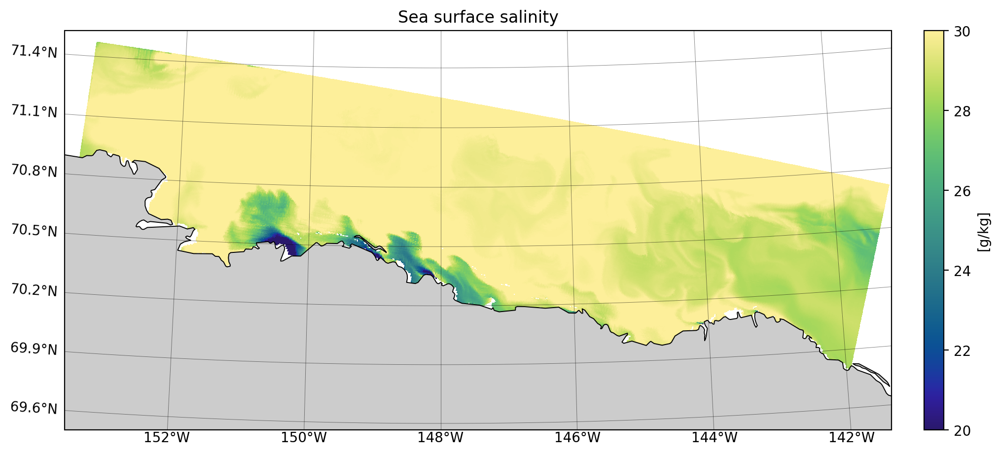

In [12]:
fig, ax = plt.subplots(1, 1, figsize=(12,4.5), dpi=200,
                       constrained_layout=True, 
                       subplot_kw={'projection': crs})

m = salt.plot(
    x='lon_rho', y='lat_rho',
    ax=ax,
    cmap=cmo.haline, transform=ccrs.PlateCarree(),
    add_colorbar=False, facecolor="gray",
    vmin = 20,vmax=30,
)
fig.colorbar(m,ax=ax,label='[g/kg]',pad=0.03)

# Set extent and map features
ax.set_extent([-153.5,-141.4,69.5, 71.5],ccrs.PlateCarree())
# ax.set_aspect(lat_rad)
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                            facecolor='0.8'), linewidth=.7)
ax.coastlines(resolution='10m', linewidth=.7)

gl = ax.gridlines(crs=ccrs.PlateCarree(), 
                  draw_labels=True, 
                  x_inline=False, y_inline=False, 
                  linewidth=0.33, color='k',alpha=0.5)
gl.right_labels = gl.top_labels = False
gl.xlocator = ticker.FixedLocator([-152, -150,-148,-146,-144,-142])
gl.xlabel_style = {'rotation': 0, 'ha': 'center'}

ax.set_title('Sea surface salinity')
fig.canvas.draw()

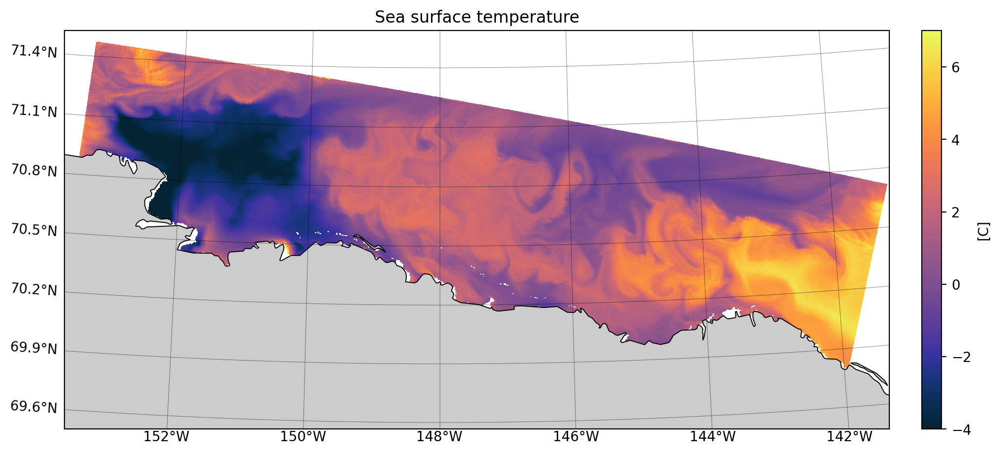

In [77]:
fig, ax = plt.subplots(1, 1, figsize=(12,4.5), dpi=200,
                       constrained_layout=True, 
                       subplot_kw={'projection': crs})

m = temp.plot(
    x='lon_rho', y='lat_rho',
    ax=ax,
    cmap=cmo.thermal, transform=ccrs.PlateCarree(),
    add_colorbar=False, facecolor="gray",
    vmin = -4,vmax=7,
)
fig.colorbar(m,ax=ax,label='[C]',pad=0.03)

# Set extent and map features
ax.set_extent([-153.5,-141.4,69.5, 71.5],ccrs.PlateCarree())
# ax.set_aspect(lat_rad)
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                            facecolor='0.8'), linewidth=.7)
ax.coastlines(resolution='10m', linewidth=.7)

gl = ax.gridlines(crs=ccrs.PlateCarree(), 
                  draw_labels=True, 
                  x_inline=False, y_inline=False, 
                  linewidth=0.33, color='k',alpha=0.5)
gl.right_labels = gl.top_labels = False
gl.xlocator = ticker.FixedLocator([-152, -150,-148,-146,-144,-142])
gl.xlabel_style = {'rotation': 0, 'ha': 'center'}

ax.set_title('Sea surface temperature')
fig.canvas.draw()

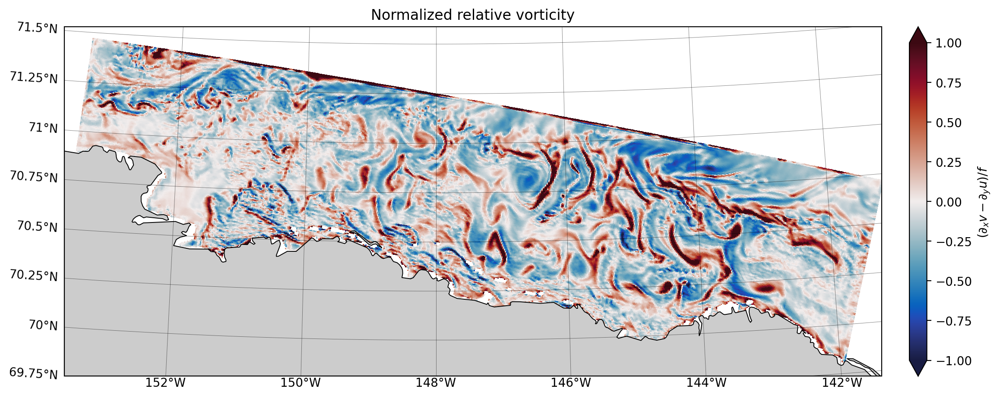

In [10]:
fig, ax = plt.subplots(1, 1, figsize=(12,4.5), dpi=200,
                       constrained_layout=True, 
                       subplot_kw={'projection': crs})


m = rvort.plot(
    x='lon_rho', y='lat_rho',
    ax=ax,
    cmap=cmo.balance, transform=ccrs.PlateCarree(),
    add_colorbar=False, facecolor="gray",
    vmin = -1,vmax=1,
)
fig.colorbar(m,ax=ax,extend='both',
             label=r'($\partial_x v - \partial_y u)/f$',
             pad=0.03)

# Set extent and map features
ax.set_extent([-153.5,-141.4,69.75, 71.5],ccrs.PlateCarree())
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                            facecolor='0.8'), linewidth=.7)
ax.coastlines(resolution='10m', linewidth=.7)

gl = ax.gridlines(crs=ccrs.PlateCarree(), 
                  draw_labels=True, 
                  x_inline=False, y_inline=False, 
                  linewidth=0.33, color='k',alpha=0.5)
gl.right_labels = gl.top_labels = False
gl.xlocator = ticker.FixedLocator([-152, -150,-148,-146,-144,-142])
gl.xlabel_style = {'rotation': 0, 'ha': 'center'}

ax.set_title('Normalized relative vorticity')
fig.canvas.draw()

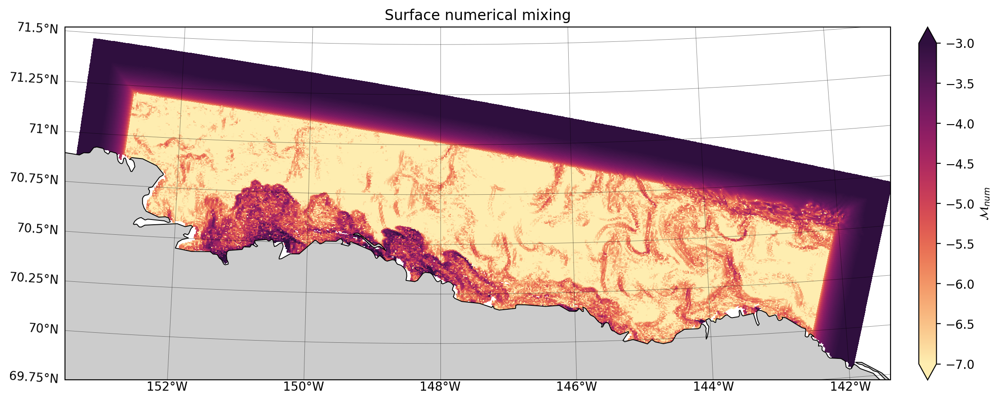

In [40]:
fig, ax = plt.subplots(1, 1, figsize=(12,4.5), dpi=200,
                       constrained_layout=True, 
                       subplot_kw={'projection': crs})


m = np.log10(np.abs(mnum)).plot(
    x='lon_rho', y='lat_rho',
    ax=ax,
    cmap=cmo.matter, transform=ccrs.PlateCarree(),
    add_colorbar=False, facecolor="gray",
    vmin = -7,vmax=-3,
)
fig.colorbar(m,ax=ax,extend='both',
             label=r'$\mathcal{M}_{num}$',
             pad=0.03)

# Set extent and map features
ax.set_extent([-153.5,-141.4,69.75, 71.5],ccrs.PlateCarree())
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                            facecolor='0.8'), linewidth=.7)
ax.coastlines(resolution='10m', linewidth=.7)

gl = ax.gridlines(crs=ccrs.PlateCarree(), 
                  draw_labels=True, 
                  x_inline=False, y_inline=False, 
                  linewidth=0.33, color='k',alpha=0.5)
gl.right_labels = gl.top_labels = False
gl.xlocator = ticker.FixedLocator([-152, -150,-148,-146,-144,-142])
gl.xlabel_style = {'rotation': 0, 'ha': 'center'}

ax.set_title('Surface numerical mixing')
fig.canvas.draw()

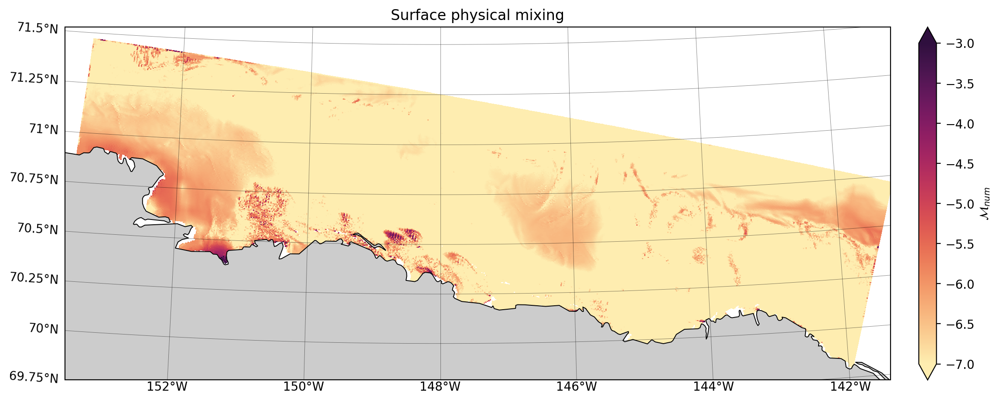

In [44]:
fig, ax = plt.subplots(1, 1, figsize=(12,4.5), dpi=200,
                       constrained_layout=True, 
                       subplot_kw={'projection': crs})


m = ax.pcolormesh(ds.lon_rho, ds.lat_rho, np.log10(np.abs(mphy)),
    cmap=cmo.matter, transform=ccrs.PlateCarree(),facecolor="gray",
    vmin = -7,vmax=-3,
)
fig.colorbar(m,ax=ax,extend='both',
             label=r'$\mathcal{M}_{phy}$',
             pad=0.03)

# Set extent and map features
ax.set_extent([-153.5,-141.4,69.75, 71.5],ccrs.PlateCarree())
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                            facecolor='0.8'), linewidth=.7)
ax.coastlines(resolution='10m', linewidth=.7)

gl = ax.gridlines(crs=ccrs.PlateCarree(), 
                  draw_labels=True, 
                  x_inline=False, y_inline=False, 
                  linewidth=0.33, color='k',alpha=0.5)
gl.right_labels = gl.top_labels = False
gl.xlocator = ticker.FixedLocator([-152, -150,-148,-146,-144,-142])
gl.xlabel_style = {'rotation': 0, 'ha': 'center'}

ax.set_title('Surface physical mixing')
fig.canvas.draw()

### The sponge layer and aggressive nudging are wrecking the numerical mixing. Check the end of the simulation to make sure it's not drifting away from reality

In [57]:
mnum = ds.dye_03.isel(ocean_time=-1,s_rho=-1).compute()
mphy = grid.interp(ds.AKr,'Z',boundary='extend')
mphy = mphy.isel(ocean_time=-1,s_rho=-1).compute()

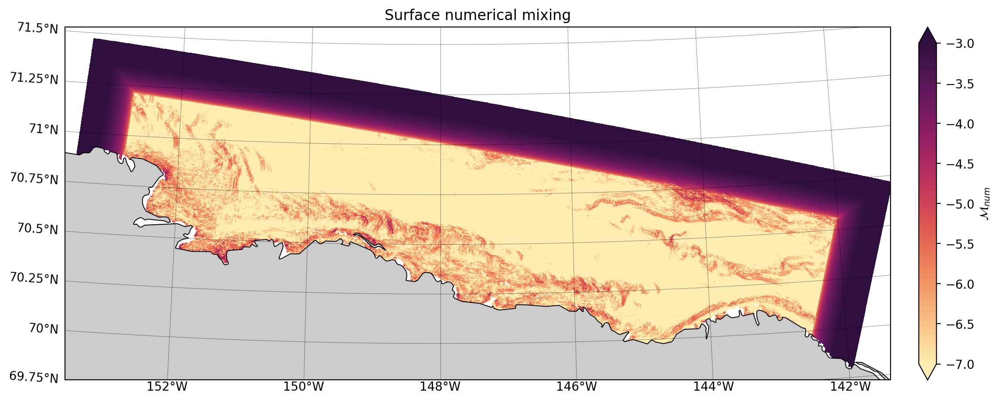

In [58]:
fig, ax = plt.subplots(1, 1, figsize=(12,4.5), dpi=200,
                       constrained_layout=True, 
                       subplot_kw={'projection': crs})


m = np.log10(np.abs(mnum)).plot(
    x='lon_rho', y='lat_rho',
    ax=ax,
    cmap=cmo.matter, transform=ccrs.PlateCarree(),
    add_colorbar=False, facecolor="gray",
    vmin = -7,vmax=-3,
)
fig.colorbar(m,ax=ax,extend='both',
             label=r'$\mathcal{M}_{num}$',
             pad=0.03)

# Set extent and map features
ax.set_extent([-153.5,-141.4,69.75, 71.5],ccrs.PlateCarree())
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                            facecolor='0.8'), linewidth=.7)
ax.coastlines(resolution='10m', linewidth=.7)

gl = ax.gridlines(crs=ccrs.PlateCarree(), 
                  draw_labels=True, 
                  x_inline=False, y_inline=False, 
                  linewidth=0.33, color='k',alpha=0.5)
gl.right_labels = gl.top_labels = False
gl.xlocator = ticker.FixedLocator([-152, -150,-148,-146,-144,-142])
gl.xlabel_style = {'rotation': 0, 'ha': 'center'}

ax.set_title('Surface numerical mixing')
fig.canvas.draw()

### We should probably try to reduce the size of the sponge and or nudging layer. That removes a significant fraction of the domain for analysis where there are good physics

### In this snapshot, surface fronts are clearly influenced more by temperature. 
These fronts are definetely submesoscale since the fronts of the Rossby number are Order 1, but we're not close to submesoscale resolving since they are still quite blurry. 

### It would be useful to know if this is true generally. 
One diagnostic quantity to do that is the horizontal turner angle: 
$r$ is the normalized horizontal Turner angle ($r=\frac{45-\left | Tu \right |}{45}$), and $Tu=\tan^{-1} \left ( \frac{\alpha}{\beta} \frac{\left | \nabla_h T\right |}{\left | \nabla_h S\right |}\right )$. A probability density function of this over the period/location we choose for later statistical analysis would be very helpful for building intuition for numerical mixing. For example, is numerical mixing controlled more by temperature or salt gradients? My initial bet is temperature

### Visual check, what if we plotted this without the projection? 

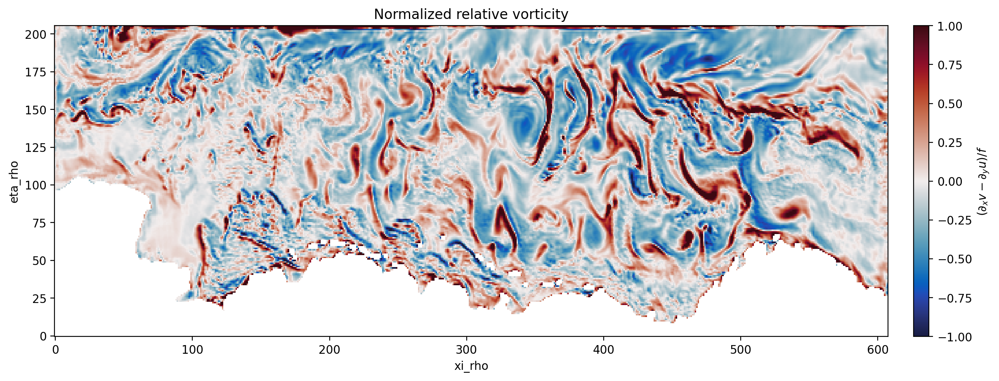

In [13]:
fig, ax = plt.subplots(1, 1, figsize=(12, 4.5), dpi=200,
                       constrained_layout=True, 
                       )


m = rvort.plot(
    ax=ax,
    cmap=cmo.balance,
    add_colorbar=False, facecolor="gray",
    vmin = -1,vmax=1,
)
fig.colorbar(m,ax=ax,label=r'($\partial_x v - \partial_y u)/f$',pad=0.03)

# Set extent and map features
# ax.set_extent([-153.5,-141.4,69.5, 71.5],ccrs.PlateCarree())
# ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                            # facecolor='0.8'), linewidth=.7)
# ax.coastlines(resolution='10m', linewidth=.7)

# gl = ax.gridlines(crs=ccrs.PlateCarree(), 
#                   draw_labels=True, 
#                   x_inline=False, y_inline=False, 
#                   linewidth=0.33, color='k',alpha=0.5)
# gl.right_labels = gl.top_labels = False
# gl.xlocator = ticker.FixedLocator([-152, -150,-148,-146,-144,-142])
# gl.xlabel_style = {'rotation': 0, 'ha': 'center'}

ax.set_title('Normalized relative vorticity')
fig.canvas.draw()

### What about lat/lon coordinates with no projection

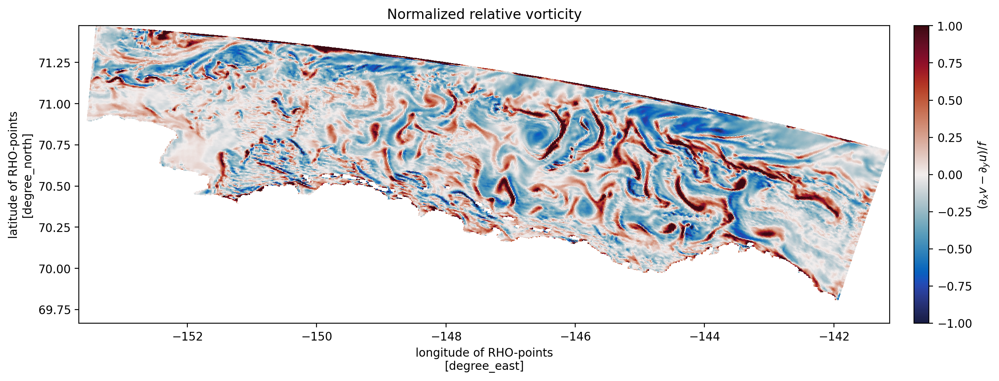

In [14]:
fig, ax = plt.subplots(1, 1, figsize=(12, 4.5), dpi=200,
                       constrained_layout=True, 
                       )


m = rvort.plot(x='lon_rho',y='lat_rho',
    ax=ax,
    cmap=cmo.balance,
    add_colorbar=False, facecolor="gray",
    vmin = -1,vmax=1,
)
fig.colorbar(m,ax=ax,label=r'($\partial_x v - \partial_y u)/f$',pad=0.03)

# Set extent and map features
# ax.set_extent([-153.5,-141.4,69.5, 71.5],ccrs.PlateCarree())
# ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                            # facecolor='0.8'), linewidth=.7)
# ax.coastlines(resolution='10m', linewidth=.7)

# gl = ax.gridlines(crs=ccrs.PlateCarree(), 
#                   draw_labels=True, 
#                   x_inline=False, y_inline=False, 
#                   linewidth=0.33, color='k',alpha=0.5)
# gl.right_labels = gl.top_labels = False
# gl.xlocator = ticker.FixedLocator([-152, -150,-148,-146,-144,-142])
# gl.xlabel_style = {'rotation': 0, 'ha': 'center'}

ax.set_title('Normalized relative vorticity')
fig.canvas.draw()

In [80]:
dsn = xr.open_dataset('/global/homes/d/dylan617/repos/beaufort_roms/ROMS_clm_weights_002.nc')

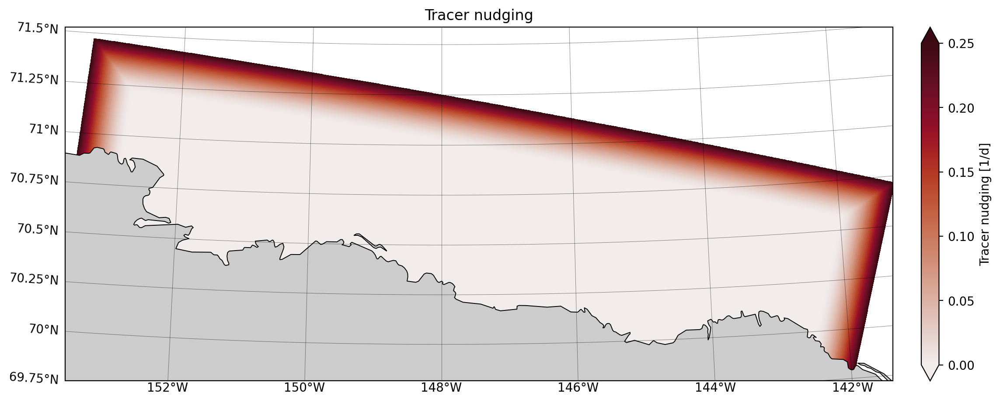

In [85]:
fig, ax = plt.subplots(1, 1, figsize=(12,4.5), dpi=200,
                       constrained_layout=True, 
                       subplot_kw={'projection': crs})


m = ax.pcolormesh(ds.lon_rho, ds.lat_rho, dsn.tracer_NudgeCoef[0],
    cmap=cmo.amp, transform=ccrs.PlateCarree(),facecolor="gray",
)
fig.colorbar(m,ax=ax,extend='both',
             label=r'Tracer nudging [1/d]',
             pad=0.03)

# Set extent and map features
ax.set_extent([-153.5,-141.4,69.75, 71.5],ccrs.PlateCarree())
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                            facecolor='0.8'), linewidth=.7)
ax.coastlines(resolution='10m', linewidth=.7)

gl = ax.gridlines(crs=ccrs.PlateCarree(), 
                  draw_labels=True, 
                  x_inline=False, y_inline=False, 
                  linewidth=0.33, color='k',alpha=0.5)
gl.right_labels = gl.top_labels = False
gl.xlocator = ticker.FixedLocator([-152, -150,-148,-146,-144,-142])
gl.xlabel_style = {'rotation': 0, 'ha': 'center'}

ax.set_title('Tracer nudging')
fig.canvas.draw()

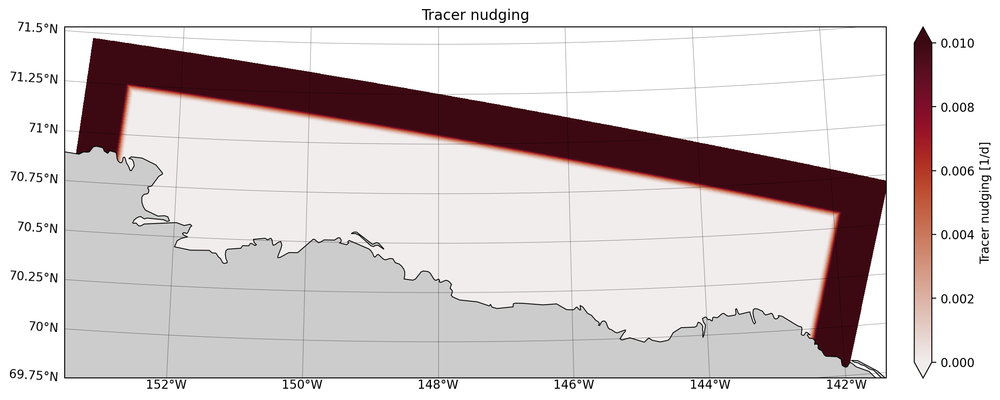

In [99]:
fig, ax = plt.subplots(1, 1, figsize=(12,4.5), dpi=200,
                       constrained_layout=True, 
                       subplot_kw={'projection': crs})


m = ax.pcolormesh(ds.lon_rho, ds.lat_rho, dsn.tracer_NudgeCoef[0],
    cmap=cmo.amp, transform=ccrs.PlateCarree(),facecolor="gray",
    vmin=0,vmax=0.01)
fig.colorbar(m,ax=ax,extend='both',
             label=r'Tracer nudging [1/d]',
             pad=0.03)

# Set extent and map features
ax.set_extent([-153.5,-141.4,69.75, 71.5],ccrs.PlateCarree())
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                            facecolor='0.8'), linewidth=.7)
ax.coastlines(resolution='10m', linewidth=.7)

gl = ax.gridlines(crs=ccrs.PlateCarree(), 
                  draw_labels=True, 
                  x_inline=False, y_inline=False, 
                  linewidth=0.33, color='k',alpha=0.5)
gl.right_labels = gl.top_labels = False
gl.xlocator = ticker.FixedLocator([-152, -150,-148,-146,-144,-142])
gl.xlabel_style = {'rotation': 0, 'ha': 'center'}

ax.set_title('Tracer nudging')
fig.canvas.draw()

### The grid is disorted without at least plotting in lat/lon coords, unless you manually set the aspect ratio.
Plot divergence and strain

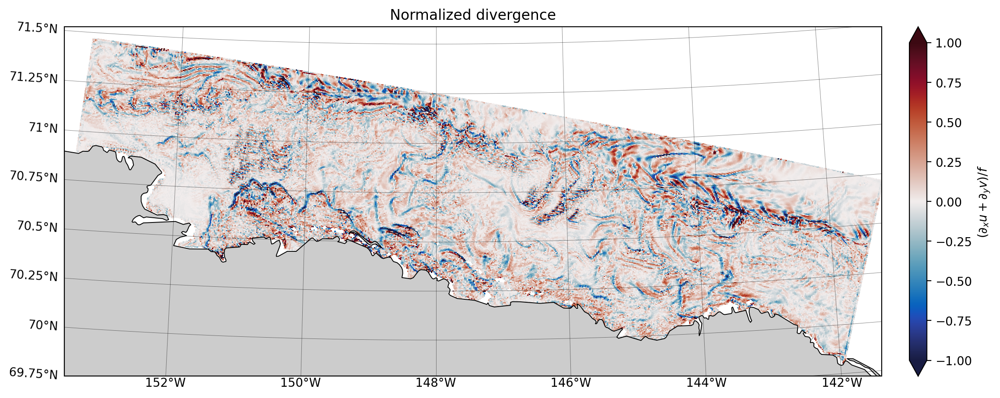

In [15]:
fig, ax = plt.subplots(1, 1, figsize=(12,4.5), dpi=200,
                       constrained_layout=True, 
                       subplot_kw={'projection': crs})

m = div.plot(
    x='lon_rho', y='lat_rho',
    ax=ax,
    cmap=cmo.balance, transform=ccrs.PlateCarree(),
    add_colorbar=False, facecolor="gray",
    vmin = -1,vmax=1,
)
fig.colorbar(m,ax=ax,extend='both',
             label=r'($\partial_x u + \partial_y v)/f$',
             pad=0.03)

# Set extent and map features
ax.set_extent([-153.5,-141.4,69.75, 71.5],ccrs.PlateCarree())
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                            facecolor='0.8'), linewidth=.7)
ax.coastlines(resolution='10m', linewidth=.7)

gl = ax.gridlines(crs=ccrs.PlateCarree(), 
                  draw_labels=True, 
                  x_inline=False, y_inline=False, 
                  linewidth=0.33, color='k',alpha=0.5)
gl.right_labels = gl.top_labels = False
gl.xlocator = ticker.FixedLocator([-152, -150,-148,-146,-144,-142])
gl.xlabel_style = {'rotation': 0, 'ha': 'center'}

ax.set_title('Normalized divergence')
fig.canvas.draw()

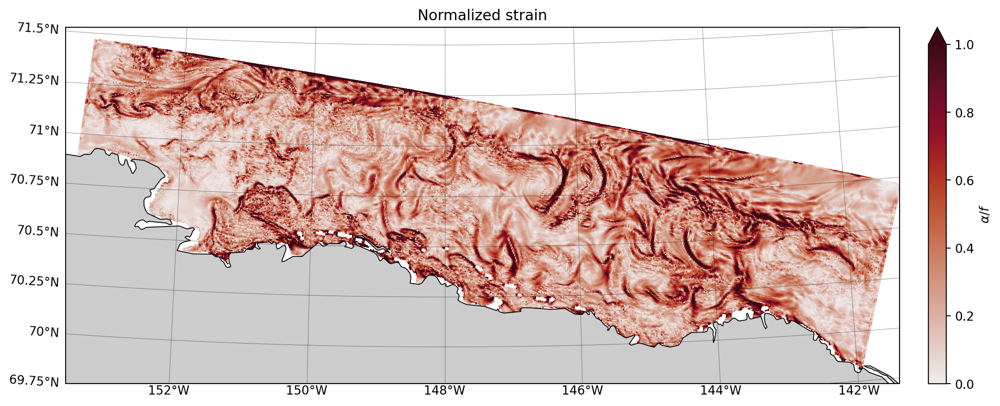

In [18]:
fig, ax = plt.subplots(1, 1, figsize=(12,4.5), dpi=200,
                       constrained_layout=True, 
                       subplot_kw={'projection': crs})

m = alpha.plot(
    x='lon_rho', y='lat_rho',
    ax=ax,
    cmap=cmo.amp, transform=ccrs.PlateCarree(),
    add_colorbar=False, facecolor="gray",
    vmin = 0,vmax=1,
)
fig.colorbar(m,ax=ax,extend='max',
             label=r'$\alpha/f$',
             pad=0.03)

# Set extent and map features
ax.set_extent([-153.5,-141.4,69.75, 71.5],ccrs.PlateCarree())
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                            facecolor='0.8'), linewidth=.7)
ax.coastlines(resolution='10m', linewidth=.7)

gl = ax.gridlines(crs=ccrs.PlateCarree(), 
                  draw_labels=True, 
                  x_inline=False, y_inline=False, 
                  linewidth=0.33, color='k',alpha=0.5)
gl.right_labels = gl.top_labels = False
gl.xlocator = ticker.FixedLocator([-152, -150,-148,-146,-144,-142])
gl.xlabel_style = {'rotation': 0, 'ha': 'center'}

ax.set_title('Normalized strain')
fig.canvas.draw()

### Let's plot a box for statistics of the velocity gradient tensor

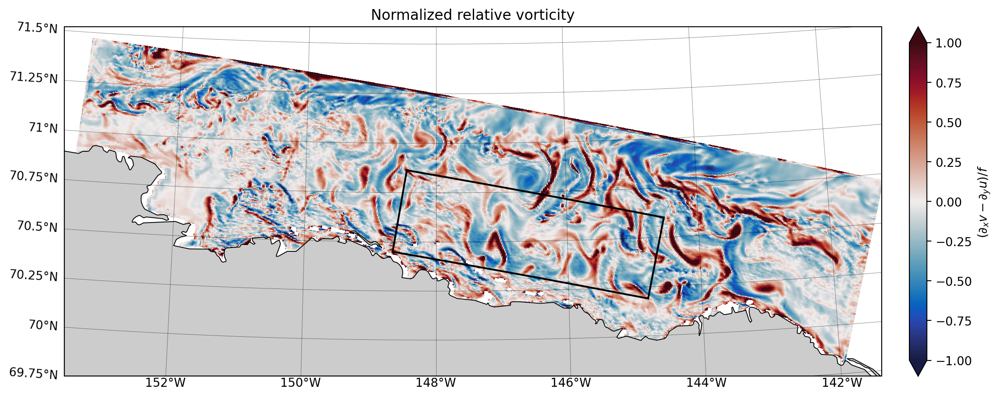

In [54]:
fig, ax = plt.subplots(1, 1, figsize=(12,4.5), dpi=200,
                       constrained_layout=True, 
                       subplot_kw={'projection': crs})

m = rvort.plot(
    x='lon_rho', y='lat_rho',
    ax=ax,
    cmap=cmo.balance, transform=ccrs.PlateCarree(),
    add_colorbar=False, facecolor="gray",
    vmin = -1,vmax=1,
)

fig.colorbar(m,ax=ax,extend='both',
             label=r'($\partial_x v - \partial_y u)/f$',
             pad=0.03)


### Did some brute forcing to get this indexing, it is a good first cut
xislice = slice(250,450)
etaslice = slice(50,130)

#Left
ax.plot(ds.lon_rho.isel(eta_rho=etaslice,xi_rho=xislice)[:,0],
        ds.lat_rho.isel(eta_rho=etaslice,xi_rho=xislice)[:,0],
        transform=ccrs.PlateCarree(), c = 'k')
#Right
ax.plot(ds.lon_rho.isel(eta_rho=etaslice,xi_rho=xislice)[:,-1],
        ds.lat_rho.isel(eta_rho=etaslice,xi_rho=xislice)[:,-1],
        transform=ccrs.PlateCarree(), c = 'k')
#Top
ax.plot(ds.lon_rho.isel(eta_rho=etaslice,xi_rho=xislice)[-1,:],
        ds.lat_rho.isel(eta_rho=etaslice,xi_rho=xislice)[-1,:],
        transform=ccrs.PlateCarree(), c = 'k')
#Bottom
ax.plot(ds.lon_rho.isel(eta_rho=etaslice,xi_rho=xislice)[0,:],
        ds.lat_rho.isel(eta_rho=etaslice,xi_rho=xislice)[0,:],
        transform=ccrs.PlateCarree(), c = 'k')

# Set extent and map features
ax.set_extent([-153.5,-141.4,69.75, 71.5],ccrs.PlateCarree())
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                            facecolor='0.8'), linewidth=.7)
ax.coastlines(resolution='10m', linewidth=.7)

gl = ax.gridlines(crs=ccrs.PlateCarree(), 
                  draw_labels=True, 
                  x_inline=False, y_inline=False, 
                  linewidth=0.33, color='k',alpha=0.5)
gl.right_labels = gl.top_labels = False
gl.xlocator = ticker.FixedLocator([-152, -150,-148,-146,-144,-142])
gl.xlabel_style = {'rotation': 0, 'ha': 'center'}

ax.set_title('Normalized relative vorticity')
fig.canvas.draw()

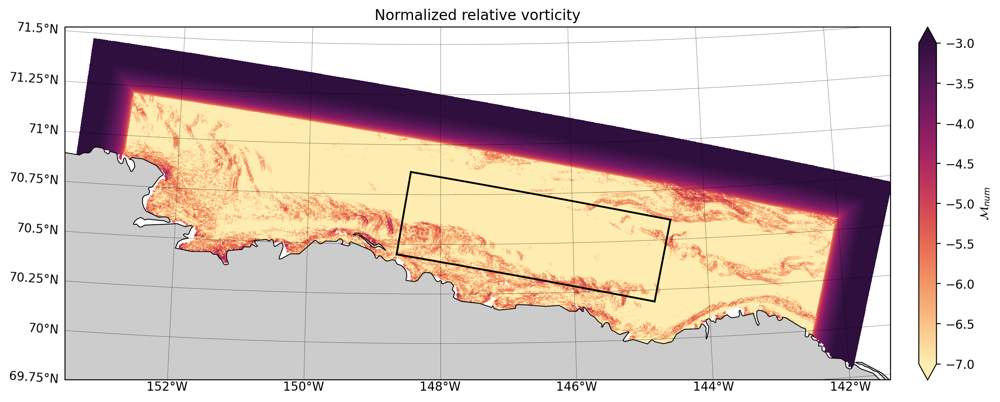

In [89]:
fig, ax = plt.subplots(1, 1, figsize=(12,4.5), dpi=200,
                       constrained_layout=True, 
                       subplot_kw={'projection': crs})

m = np.log10(np.abs(mnum)).plot(
    x='lon_rho', y='lat_rho',
    ax=ax,
    cmap=cmo.matter, transform=ccrs.PlateCarree(),
    add_colorbar=False, facecolor="gray",
    vmin = -7,vmax=-3,
)
fig.colorbar(m,ax=ax,extend='both',
             label=r'$\mathcal{M}_{num}$',
             pad=0.03)

### Did some brute forcing to get this indexing, it is a good first cut
xislice = slice(250,450)
etaslice = slice(50,130)

#Left
ax.plot(ds.lon_rho.isel(eta_rho=etaslice,xi_rho=xislice)[:,0],
        ds.lat_rho.isel(eta_rho=etaslice,xi_rho=xislice)[:,0],
        transform=ccrs.PlateCarree(), c = 'k')
#Right
ax.plot(ds.lon_rho.isel(eta_rho=etaslice,xi_rho=xislice)[:,-1],
        ds.lat_rho.isel(eta_rho=etaslice,xi_rho=xislice)[:,-1],
        transform=ccrs.PlateCarree(), c = 'k')
#Top
ax.plot(ds.lon_rho.isel(eta_rho=etaslice,xi_rho=xislice)[-1,:],
        ds.lat_rho.isel(eta_rho=etaslice,xi_rho=xislice)[-1,:],
        transform=ccrs.PlateCarree(), c = 'k')
#Bottom
ax.plot(ds.lon_rho.isel(eta_rho=etaslice,xi_rho=xislice)[0,:],
        ds.lat_rho.isel(eta_rho=etaslice,xi_rho=xislice)[0,:],
        transform=ccrs.PlateCarree(), c = 'k')

# Set extent and map features
ax.set_extent([-153.5,-141.4,69.75, 71.5],ccrs.PlateCarree())
ax.add_feature(cfeature.NaturalEarthFeature('physical', 'land', '10m',
                                            facecolor='0.8'), linewidth=.7)
ax.coastlines(resolution='10m', linewidth=.7)

gl = ax.gridlines(crs=ccrs.PlateCarree(), 
                  draw_labels=True, 
                  x_inline=False, y_inline=False, 
                  linewidth=0.33, color='k',alpha=0.5)
gl.right_labels = gl.top_labels = False
gl.xlocator = ticker.FixedLocator([-152, -150,-148,-146,-144,-142])
gl.xlabel_style = {'rotation': 0, 'ha': 'center'}

ax.set_title('Normalized relative vorticity')
fig.canvas.draw()